In [1]:
import cv2
from ultralytics import YOLO
from matplotlib import pyplot as plt
import numpy as np
from PIL import Image, ImageEnhance
import albumentations as A

In [2]:
image_path = 'image/Task1.jpeg'
image = cv2.imread(image_path)

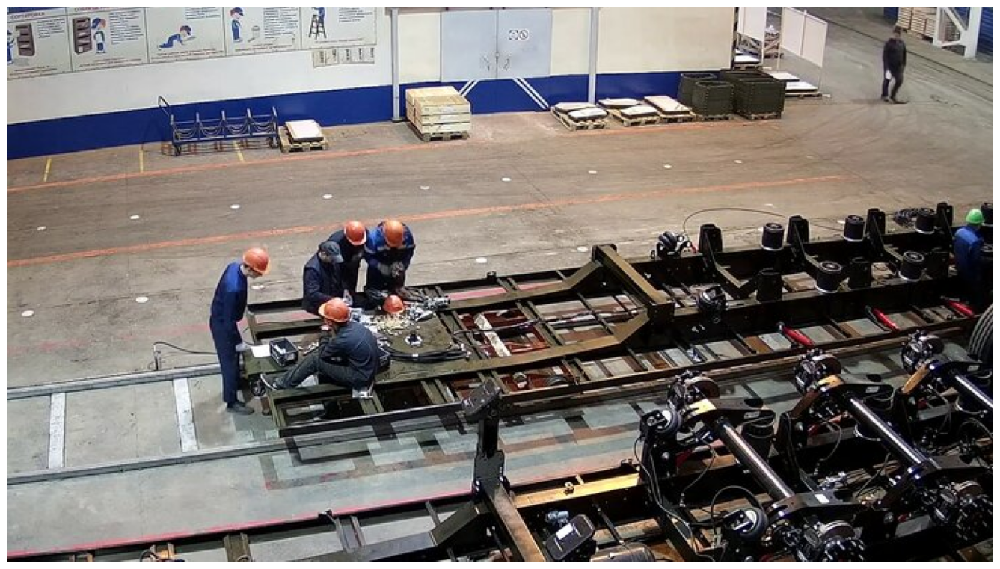

In [3]:
plt.figure(figsize=(17,11))
plt.imshow(cv2.cvtColor(image,cv2.COLOR_BGR2RGB))
plt.axis("off")
plt.show()

In [4]:
model = YOLO('yolov10x.pt')

Изначально преодобученная модель распознавала не всех людей, в основном теряла человека справа и человека между двумя другими рабочими.
Было принято решение поэкспериментировать с фильтрами. Если б было больше данных, можно было бы учить модель распознавать людей конкретно в данных услових завода, но я руководствовался логикой, что одно изображение скинуто специально, для проверки навыков работы с минимальными данными. Из минусов такого подхода, можно сразу выделить, что это не факт что это сработает для других фотографий с камеры, потому что параметры выбирались "на глаз". Также была мысль сделать перебор параметров для фильтра по сетке, и просуммировать уверенность в распознавании и стараться максимизировать данный показатель. Потом подумал что кросс валидация для одного изображения излишняя мера, и опять же тестировать надо на большем количестве фотографий. Были применены разные фильтры и подходы, лучше всего себя показало просто настройка контрастности изображения.

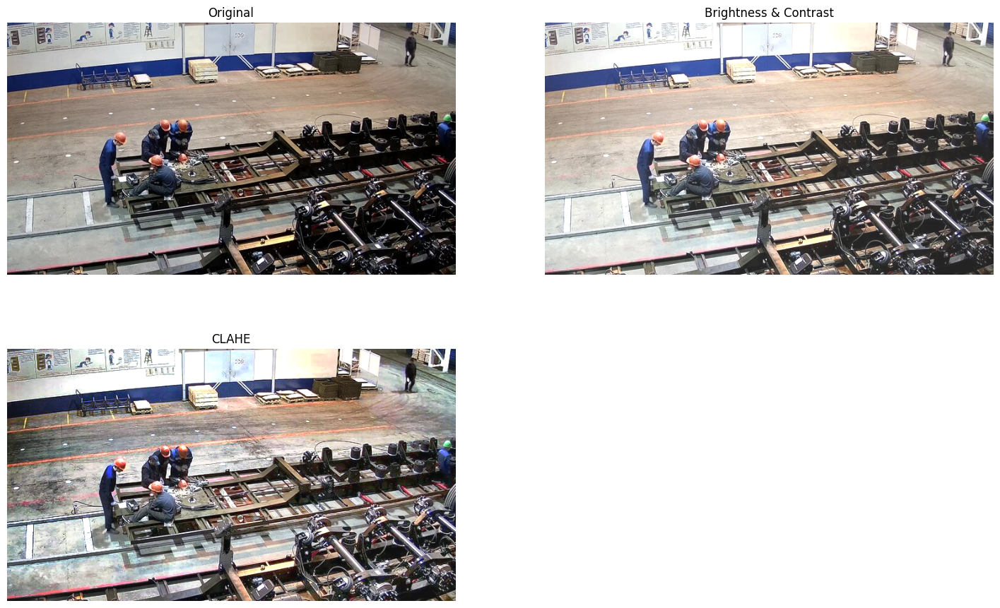

False

In [5]:
# Увеличение яркости и контраста
alpha = 1.1 
beta =  35  
bright_contrast_image = cv2.convertScaleAbs(image, alpha=alpha, beta=beta)

# Применение CLAHE
clahe = cv2.createCLAHE(clipLimit=3.5, tileGridSize=(4, 4))
clahe_image = np.zeros_like(bright_contrast_image)
for i in range(3):
    clahe_image[:, :, i] = clahe.apply(bright_contrast_image[:, :, i])

plt.figure(figsize=(18, 11))
plt.subplot(2, 2, 1), plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB)), plt.title('Original'), plt.axis("off")
plt.subplot(2, 2, 2), plt.imshow(cv2.cvtColor(bright_contrast_image, cv2.COLOR_BGR2RGB)), plt.title('Brightness & Contrast'), plt.axis("off")
plt.subplot(2, 2, 3), plt.imshow(cv2.cvtColor(clahe_image, cv2.COLOR_BGR2RGB)), plt.title('CLAHE'), plt.axis("off")
plt.show()
cv2.imwrite('/mnt/data/enhanced_clahe.jpg', clahe_image)
cv2.imwrite('/mnt/data/enhanced_brightness_contrast.jpg', bright_contrast_image)

In [6]:
detects = model(clahe_image)


0: 384x640 7 persons, 56.8ms
Speed: 3.0ms preprocess, 56.8ms inference, 24.4ms postprocess per image at shape (1, 3, 384, 640)


Подсчёт людей в следующей ячейке сделан потому что, yolo определяет кучу объектов из датасета COCO. Если модель заметит лавочку, то она тоже будет в списке разпознанных объектов. Поэтому что б избежать подобных случаев, смотрим только на класс 0(person). Но в данном случае мне повезло и ничего лишнего модель не обнаружила, просто перестраховка.

In [7]:
count_people = 0
for Clc in detects[0].boxes.cls:
    if Clc == 0:
        count_people += 1
count_people

7

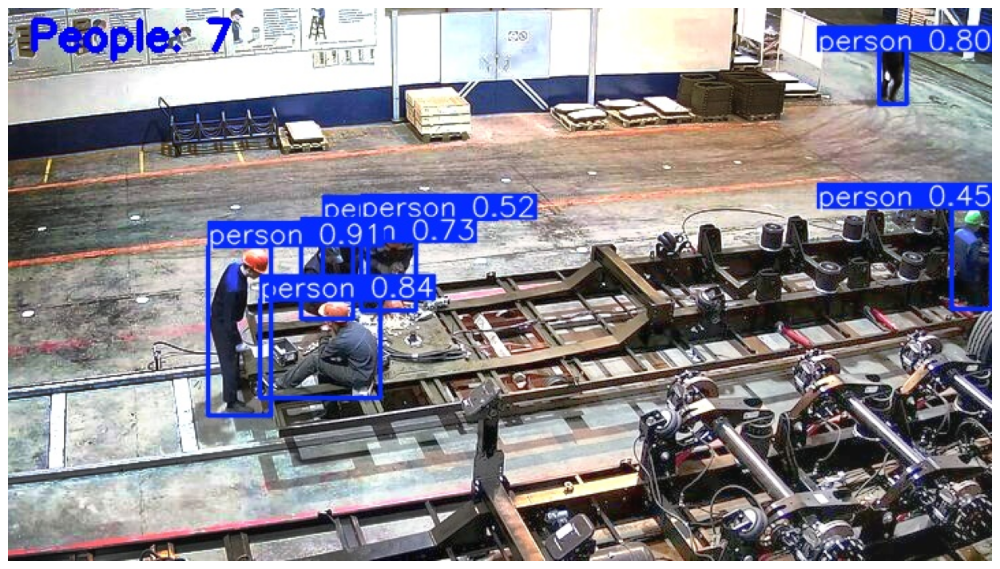

In [8]:
annotated_image = detects[0].plot()
cv2.putText(annotated_image, f'People: {count_people}', (15, 30), cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 0, 0), 4)
cv2.imwrite('output.jpg', annotated_image)
imageOutput = cv2.imread('output.jpg')
plt.figure(figsize=(22,9))
plt.imshow(cv2.cvtColor(imageOutput,cv2.COLOR_BGR2RGB))
plt.axis("off")
plt.show()

In [9]:
#Центр находил  среднеафриметический по х и по у. Расстояние Евклидово 
def calculate_distance(center1, center2):
    cx1, cy1 = center1
    cx2, cy2 = center2
    distance = ((cx2 - cx1)**2 + (cy2 - cy1)**2)**0.5
    return distance

Такую задачу возможно следует решать с помощью сегментации, и уже центр искать у сегментированного изображения. Пробовал данных подход, но у меня не получилось добиться такого же качества распознавания с помощью сегментации. Но распознанные центры распознаных объектов куда точнее разумеется.

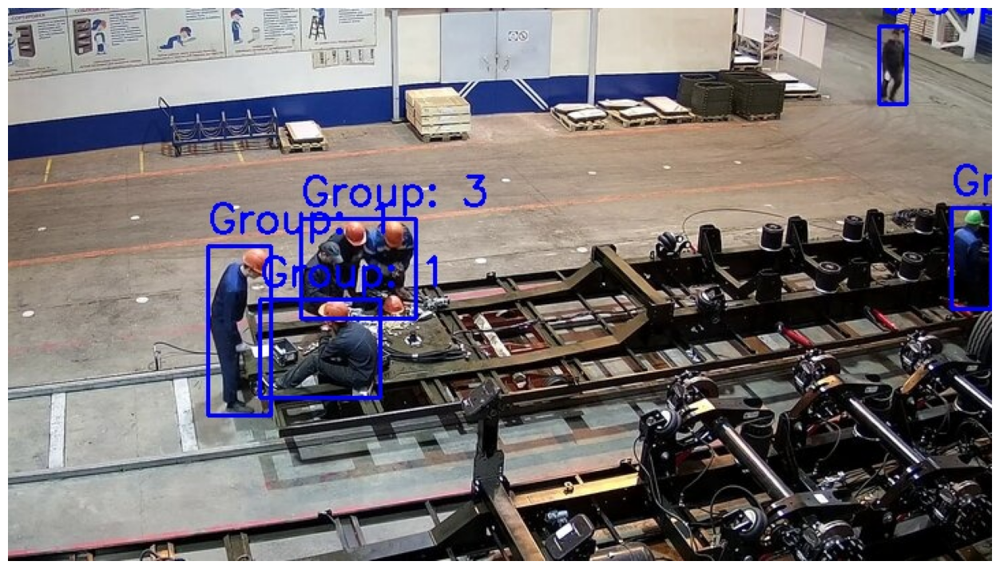

In [10]:
#Отбираем прямоугольники распознанных людей(только людей)
boxes = [detects[0].boxes.xyxy[i] for i in range(len(detects[0].boxes.xyxy)) if detects[0].boxes.cls[i] == 0.]#one box = (x_min, y_min, x_max, y_max) 
centers = [[(boxes[i][0] + boxes[i][2]), (boxes[i][1] + boxes[i][3])]  for i in range(len(boxes))] # сроазу считаем массив центров этих прямоугольников
box_group_num = [-1] * len(boxes) # здесь будут номера групп каждого наблюдения, 
#номер группы нужен просто что б их различать между собой, информации в себе не несёт. -1 значит ещё не принадлежит группе.

#Здесь использован алгоритм поиска компонент связности в графе, чуть видоизменён(условие расстояния)
# В прицнипе для читаемости можно было заменить перебором, выигрыш в производительности будет только если тысячи людей окажутся в кадре, что маловероятно

pixel_distance = 100
#Если увеличить значение 100 до 125, то группа более лучше распознается на данном изображениина на мой взгляд
def dfs(v,  num):
    box_group_num[v] = num
    for u in range(len(boxes)):
        if (v != u and box_group_num[u] == -1 and calculate_distance(centers[v], centers[u]) < pixel_distance):
            dfs(u, num)
num = 0
for u in range(len(boxes)):
    if (box_group_num[u] == -1):
            dfs(u, num)
            num += 1

groups = [[] for _ in range(num)]
for i in range(len(boxes)):
    groups[box_group_num[i]].append(i)

# Рисование прямоугольников для найденных групп
annotated_image = image.copy()
for group in groups:
    group_boxes = [boxes[i] for i in group]
    num_people = len(group)
    # Находим общий прямоугольник для текущей группы
    x_min = min([box[0] for box in group_boxes])
    y_min = min([box[1] for box in group_boxes])
    x_max = max([box[2] for box in group_boxes])
    y_max = max([box[3] for box in group_boxes])
    # Рисуем прямоугольник и добавляем текст
    cv2.rectangle(annotated_image, (int(x_min), int(y_min)), (int(x_max), int(y_max)), (255, 0, 0), 2)
    cv2.putText(annotated_image, f'Group: {num_people}', (int(x_min), int(y_min) - 10),
                cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 0, 0), 2)

# Сохранить или показать изображение с результатами
cv2.imwrite('output.jpg', annotated_image)
imageOutput = cv2.imread('output.jpg')
plt.figure(figsize=(22, 9))
plt.imshow(cv2.cvtColor(imageOutput, cv2.COLOR_BGR2RGB))
plt.axis("off")
plt.show()

Для обнаружения касок, наверное правильным было бы обучить нейросеть на распознавание касок на конкретно этом заводе(да и на других, да и вообще касок :). Но отталкиваясь от того что изображение одно, пришёл к идее анализа цвета пикселей после обработки. Применял разные фильтры с целью найти цветовые закономерности. Лучше всего себя показали оранжевый маска-фильтр и зеленый. Решение конечно спорное, оно не распознает каски другого цвета если они есть, а также при наличии оранжевой или зелёной комнаты алгоритм покажет что все в масках. Тем не менее гипотеза была следующая: 
1) На заводе только оранжевые и зелёные каски как и на изображении.
2) Каски нужно носить на голове, перевернутые люди на заводе встречаются редко -> берём распознанный прямоугольник человека и ищем вверху пиксели нужного цвета
3) Если пиксели нужного цвета присутствуют и их достаточное количество(параметр), предполагаем что маска есть.

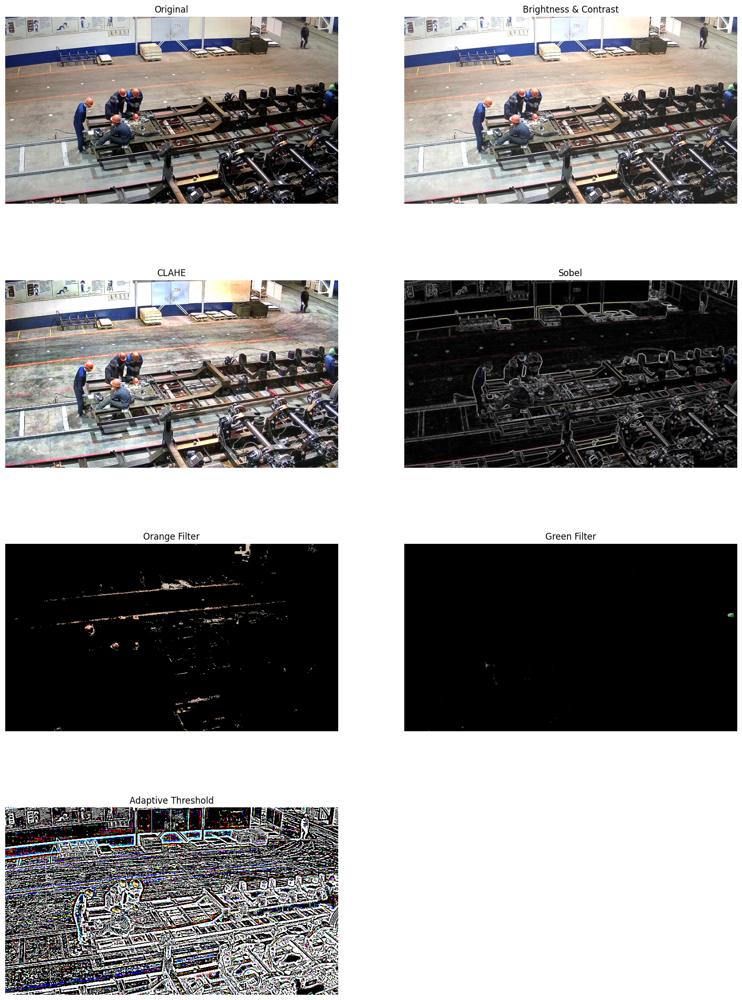

False

In [11]:
imageHelmet = cv2.imread(image_path)

alpha = 1.1
beta = 30
bright_contrast_imageHelmet = cv2.convertScaleAbs(imageHelmet, alpha=alpha, beta=beta)

# Применение CLAHE
clahe = cv2.createCLAHE(clipLimit=3.5, tileGridSize=(8, 8))
clahe_imageHelmet = np.zeros_like(bright_contrast_imageHelmet)
for i in range(3):
    clahe_imageHelmet[:, :, i] = clahe.apply(bright_contrast_imageHelmet[:, :, i])

# Применение фильтра Собеля
sobel_image = np.zeros_like(imageHelmet)
ksize = 3  # Размер ядра 
for i in range(3):
    sobelx = cv2.Sobel(imageHelmet[:, :, i], cv2.CV_64F, 1, 0, ksize=ksize)
    sobely = cv2.Sobel(imageHelmet[:, :, i], cv2.CV_64F, 0, 1, ksize=ksize)
    sobel = cv2.magnitude(sobelx, sobely)
    sobel = cv2.normalize(sobel, None, 0, 255, cv2.NORM_MINMAX)
    sobel_image[:, :, i] = np.uint8(sobel)

# Применение цветовых фильтров
hsv_image = cv2.cvtColor(imageHelmet, cv2.COLOR_BGR2HSV)
lower_orange = np.array([5, 30, 200])
upper_orange = np.array([15, 255, 255])
mask_orange = cv2.inRange(hsv_image, lower_orange, upper_orange)
orange_filtered_image = cv2.bitwise_and(imageHelmet, imageHelmet, mask=mask_orange)

lower_green = np.array([35, 50, 50])
upper_green = np.array([85, 255, 255])
mask_green = cv2.inRange(hsv_image, lower_green, upper_green)
green_filtered_image = cv2.bitwise_and(imageHelmet, imageHelmet, mask=mask_green)

# Применение пороговой адаптивности
adaptive_thresh_image = np.zeros_like(imageHelmet)
blockSize = 11  # Размер области (нечетное число)
C = 2           # Константа (меньше для более темного результата)
for i in range(3):
    adaptive_thresh_image[:, :, i] = cv2.adaptiveThreshold(imageHelmet[:, :, i], 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
                                                           cv2.THRESH_BINARY_INV, blockSize, C)


plt.figure(figsize=(18, 25))
plt.subplot(4, 2, 1), plt.imshow(cv2.cvtColor(imageHelmet, cv2.COLOR_BGR2RGB)), plt.title('Original'), plt.axis("off")
plt.subplot(4, 2, 2), plt.imshow(cv2.cvtColor(bright_contrast_imageHelmet, cv2.COLOR_BGR2RGB)), plt.title('Brightness & Contrast'), plt.axis("off")
plt.subplot(4, 2, 3), plt.imshow(cv2.cvtColor(clahe_imageHelmet, cv2.COLOR_BGR2RGB)), plt.title('CLAHE'), plt.axis("off")
plt.subplot(4, 2, 4),plt.imshow(cv2.cvtColor(sobel_image, cv2.COLOR_BGR2RGB)), plt.title('Sobel'), plt.axis("off")
plt.subplot(4, 2, 5), plt.imshow(cv2.cvtColor(orange_filtered_image, cv2.COLOR_BGR2RGB)), plt.title('Orange Filter'), plt.axis("off")
plt.subplot(4, 2, 6), plt.imshow(cv2.cvtColor(green_filtered_image, cv2.COLOR_BGR2RGB)), plt.title('Green Filter'), plt.axis("off")
plt.subplot(4, 2, 7), plt.imshow(adaptive_thresh_image, cmap='gray'), plt.title('Adaptive Threshold'), plt.axis("off")

plt.show()

cv2.imwrite('/mnt/data/enhanced_clahe.jpg', clahe_imageHelmet)
cv2.imwrite('/mnt/data/enhanced_brightness_contrast.jpg', bright_contrast_imageHelmet)
cv2.imwrite('/mnt/data/enhanced_sobel.jpg', sobel_image)
cv2.imwrite('/mnt/data/enhanced_orange_filter.jpg', orange_filtered_image)
cv2.imwrite('/mnt/data/enhanced_green_filter.jpg', green_filtered_image)
cv2.imwrite('/mnt/data/enhanced_adaptive_thresh.jpg', adaptive_thresh_image)

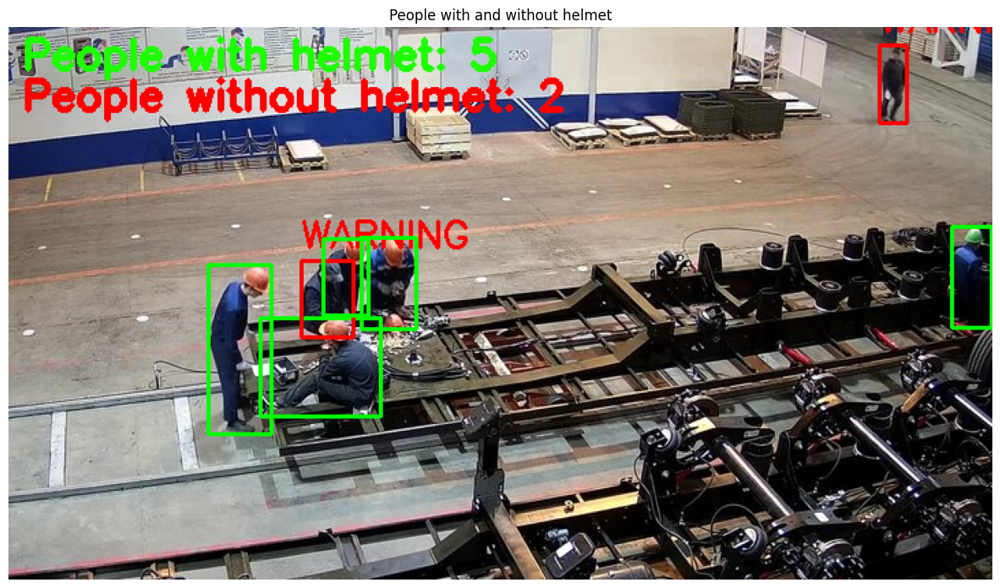

In [12]:
detected_rectangles = [detects[0].boxes.xyxy[i] for i in range(len(detects[0].boxes.xyxy)) if detects[0].boxes.cls[i] == 0.]
temp_image = image.copy()
orange_temp_image = orange_filtered_image.copy()
green_temp_image = green_filtered_image.copy()
helmets = 0
no_helmets = 0
# Настройки порога (чем выше значение, тем меньше касок будет найдено)
strictness = 0.05  # Пороговое значение для процентного содержания пикселей каски в верхней области прямоугольника
# Также была идея находить средний цвет пикселей в этой области, 
#но использовать среднее кдадратическое например(допустим изображение затемнено фильтром, пиксели цвета 0, так оранжевые пиксели сыграют большую роль в подсчёте) 
for idx, rect in enumerate(detected_rectangles):
    x1, y1, x2, y2 = map(int, rect)
    w = x2 - x1
    h = y2 - y1
    # Извлекаем верхнюю часть области с человеком (20% от высоты)
    top_area_orange = orange_temp_image[y1 : y1 + int(0.2 * h), x1 : x2]
    top_area_green = green_temp_image[y1 : y1 + int(0.2 * h), x1 : x2]
    
    # Преобразуем извлеченные области в HSV цветовое пространство
    hsv_top_area_orange = cv2.cvtColor(top_area_orange, cv2.COLOR_BGR2HSV)
    hsv_top_area_green = cv2.cvtColor(top_area_green, cv2.COLOR_BGR2HSV)
    
    # Определяем маски для оранжевых и зеленых цветов
    mask_orange = cv2.inRange(hsv_top_area_orange, lower_orange, upper_orange)
    mask_green = cv2.inRange(hsv_top_area_green, lower_green, upper_green)
    
    # Вычисляем процент оранжевых и зеленых пикселей
    orange_ratio = np.sum(mask_orange > 0) / (mask_orange.shape[0] * mask_orange.shape[1])
    green_ratio = np.sum(mask_green > 0) / (mask_green.shape[0] * mask_green.shape[1])
    
    # Определяем наличие каски на основе процентного содержания пикселей
    if orange_ratio > strictness or green_ratio > strictness:
        label = '' 
        color = (0, 255, 0) 
        helmets += 1
    else:
        label = 'WARNING'
        color = (0, 0, 255)  
        no_helmets += 1
    
    # Рисуем прямоугольник вокруг человека и добавляем текст
    cv2.rectangle(temp_image, (x1, y1), (x2, y2), color, 2)
    cv2.putText(temp_image, label, (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.9, color, 2)

# Показать изображение с результатами
cv2.putText(temp_image, f'People with helmet: {helmets}', (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 255, 30), 3)
cv2.putText(temp_image, f'People without helmet: {no_helmets}', (10, 60), cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 0, 255), 3)
plt.figure(figsize=(15, 10))
plt.imshow(cv2.cvtColor(temp_image, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.title('People with and without helmet')
plt.show()

Делал задание с душой, буду рад любой обратной связи. Критика и советы приветствуются. 
Если есть какие нибудь материалы которые было бы не лишним изучить, буду рад этим заняться.
Спасибо что уделили время на проверку, жду следующего задания!
Tg @Agent_Morosha